In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

depth = cv2.imread("/Users/baback/Documents/dev/uw/experiments/stereo/e121-test-background-composition-on-other-scenes/harry_styles/harry_styles_scene_1/harry_styles_background_plate_A10_B0005_depth.png", -1)
rgb = cv2.imread("/Users/baback/Documents/dev/uw/experiments/stereo/e121-test-background-composition-on-other-scenes/harry_styles/harry_styles_scene_1/harry_styles_background_plate_A10_B0005.png")

rgb = cv2.cvtColor(rgb, cv2.COLOR_BGR2RGB)

def show(img):
    # Create a figure to show the images
    plt.figure(figsize=(10, 5))

    # Show RGB image
    plt.imshow(img)
    plt.axis("off")  # Hide axis

    # Display the images
    plt.show()

show(rgb)
show(depth)

ycrcb = cv2.cvtColor(rgb, cv2.COLOR_RGB2YCrCb)
L, Cr, Cb = cv2.split(ycrcb)
Cr_4bit = Cr >> 4
Cb_4bit = Cb >> 4
packed_chrome = (Cr_4bit << 4) | Cb_4bit

depth_u8 = ((depth.astype(np.float32)/65535.0)*255.0).astype(np.uint8)

L_PackedChroma_Depth = np.zeros_like(rgb)
L_PackedChroma_Depth[:,:,0] = L
L_PackedChroma_Depth[:,:,1] = packed_chrome
L_PackedChroma_Depth[:,:,2] = depth_u8

show(L_PackedChroma_Depth)

Cr_unpacked = (packed_chrome >> 4) & 0xF  # Extract the upper 4 bits for Cr
Cb_unpacked = packed_chrome & 0xF         # Extract the lower 4 bits for Cb

# Scale the 4-bit values back to 8-bit by multiplying by 16
Cr_unpacked = Cr_unpacked * 16
Cb_unpacked = Cb_unpacked * 16

unpacked_image = np.zeros_like(L_PackedChroma_Depth)
unpacked_image[:,:,0] = L
unpacked_image[:,:,1] = Cr_unpacked
unpacked_image[:,:,2] = Cb_unpacked

rgb_unpacked = cv2.cvtColor(unpacked_image, cv2.COLOR_YCrCb2RGB)
show(rgb_unpacked)



error: OpenCV(4.10.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.cpp:196: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


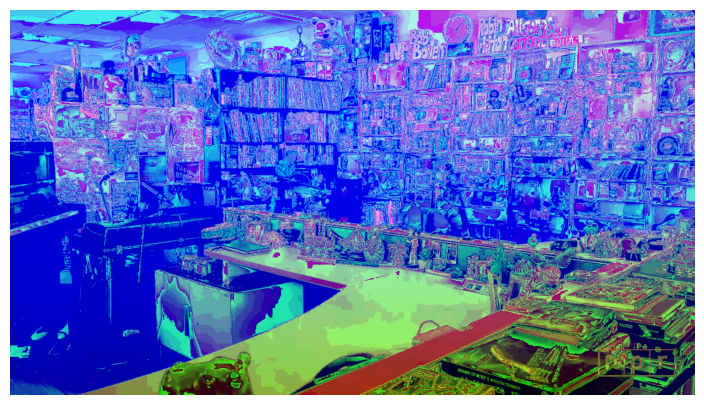

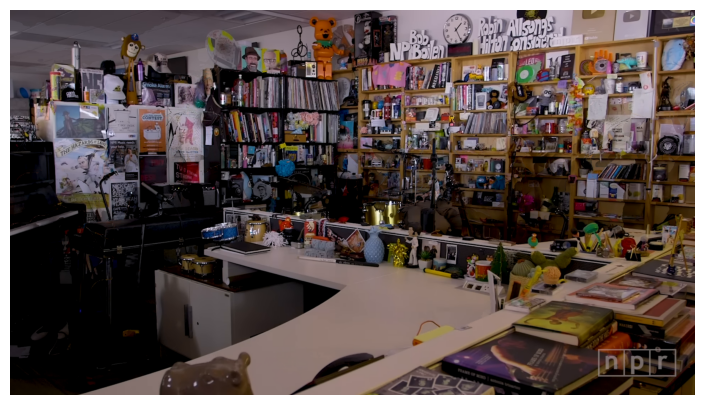

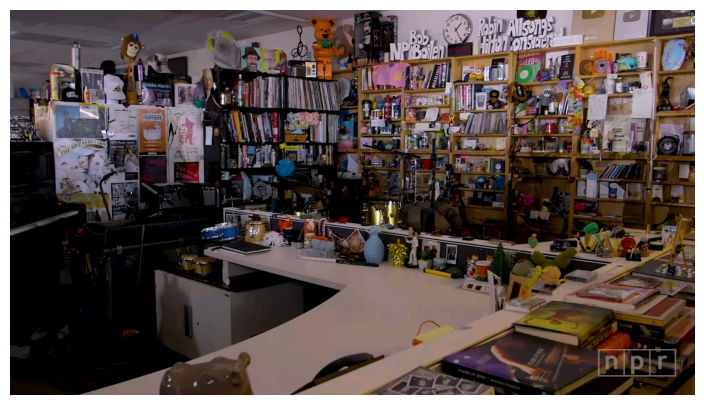

In [3]:
def convert_image_to_16bit(img):
    """
    Convert an OpenCV BGR/RGB image to 16-bit RGB565 format.
    
    Args:
        img: NumPy array of shape (height, width, 3) in BGR or RGB format
             with values in range 0-255
    
    Returns:
        NumPy array of shape (height, width) with 16-bit unsigned integers
        representing RGB565 colors
    """
    # Ensure input is in correct format
    if len(img.shape) != 3 or img.shape[2] != 3:
        raise ValueError("Input image must be a 3-channel color image")
    
    # Create output array
    height, width = img.shape[:2]
    output = np.zeros((height, width), dtype=np.uint16)
    
    # Vectorized conversion
    r = img[:,:,2] if img.dtype == np.uint8 else (img[:,:,2] * 255).astype(np.uint8)
    g = img[:,:,1] if img.dtype == np.uint8 else (img[:,:,1] * 255).astype(np.uint8)
    b = img[:,:,0] if img.dtype == np.uint8 else (img[:,:,0] * 255).astype(np.uint8)
    
    # Convert to 5-6-5 bits
    r5 = (r >> 3).astype(np.uint16)
    g6 = (g >> 2).astype(np.uint16)
    b5 = (b >> 3).astype(np.uint16)
    
    # Combine channels
    output = (r5 << 11) | (g6 << 5) | b5
    
    return output

def convert_16bit_to_image(img16):
    """
    Convert a 16-bit RGB565 image back to 24-bit BGR format for OpenCV.
    
    Args:
        img16: NumPy array of shape (height, width) containing 16-bit RGB565 values
    
    Returns:
        NumPy array of shape (height, width, 3) in BGR format with 8-bit values
    """
    height, width = img16.shape
    output = np.zeros((height, width, 3), dtype=np.uint8)
    
    # Extract channels (vectorized)
    r5 = (img16 >> 11) & 0x1F
    g6 = (img16 >> 5) & 0x3F
    b5 = img16 & 0x1F
    
    # Scale to 8 bits
    output[:,:,2] = ((r5 * 255 + 15) // 31).astype(np.uint8)  # Red channel
    output[:,:,1] = ((g6 * 255 + 31) // 63).astype(np.uint8)  # Green channel
    output[:,:,0] = ((b5 * 255 + 15) // 31).astype(np.uint8)  # Blue channel
    
    return output

def convert_image_to_16bit_dual_channel(img):
    """
    Convert an OpenCV BGR/RGB image to 16-bit RGB565 format,
    then split into two 8-bit channels.
    
    Args:
        img: NumPy array of shape (height, width, 3) in BGR/RGB format
    
    Returns:
        NumPy array of shape (height, width, 2) with two 8-bit channels
        representing the high and low bytes of the RGB565 data
    """
    # First convert to 16-bit RGB565
    rgb565 = convert_image_to_16bit(img)
    
    # Split into high and low bytes
    high_byte = (rgb565 >> 8).astype(np.uint8)
    low_byte = (rgb565 & 0xFF).astype(np.uint8)
    
    # Stack the channels
    return np.stack([high_byte, low_byte], axis=2)

def convert_dual_channel_to_bgr(dual_channel_img):
    """
    Convert a two-channel 8-bit image (representing 16-bit RGB565) back to BGR.
    
    Args:
        dual_channel_img: NumPy array of shape (height, width, 2)
                         where channels are high and low bytes
    
    Returns:
        NumPy array of shape (height, width, 3) in BGR format
    """
    # Combine the two channels back into 16-bit
    high_byte = dual_channel_img[:, :, 0].astype(np.uint16)
    low_byte = dual_channel_img[:, :, 1].astype(np.uint16)
    rgb565 = (high_byte << 8) | low_byte
    
    # Convert back to BGR
    return convert_16bit_to_image(rgb565)

def convert_image_to_16bit(img):
    """Convert an OpenCV BGR/RGB image to 16-bit RGB565 format."""
    if len(img.shape) != 3 or img.shape[2] != 3:
        raise ValueError("Input image must be a 3-channel color image")
    
    height, width = img.shape[:2]
    
    # Vectorized conversion
    r = img[:,:,2] if img.dtype == np.uint8 else (img[:,:,2] * 255).astype(np.uint8)
    g = img[:,:,1] if img.dtype == np.uint8 else (img[:,:,1] * 255).astype(np.uint8)
    b = img[:,:,0] if img.dtype == np.uint8 else (img[:,:,0] * 255).astype(np.uint8)
    
    # Convert to 5-6-5 bits
    r5 = (r >> 3).astype(np.uint16)
    g6 = (g >> 2).astype(np.uint16)
    b5 = (b >> 3).astype(np.uint16)
    
    # Combine channels
    return (r5 << 11) | (g6 << 5) | b5

def convert_16bit_to_image(img16):
    """Convert a 16-bit RGB565 image back to 24-bit BGR format."""
    height, width = img16.shape
    output = np.zeros((height, width, 3), dtype=np.uint8)
    
    # Extract channels (vectorized)
    r5 = (img16 >> 11) & 0x1F
    g6 = (img16 >> 5) & 0x3F
    b5 = img16 & 0x1F
    
    # Scale to 8 bits
    output[:,:,2] = ((r5 * 255 + 15) // 31).astype(np.uint8)  # Red
    output[:,:,1] = ((g6 * 255 + 31) // 63).astype(np.uint8)  # Green
    output[:,:,0] = ((b5 * 255 + 15) // 31).astype(np.uint8)  # Blue
    
    return output

dual_channel_rgb = convert_image_to_16bit_dual_channel(cv2.cvtColor(rgb, cv2.COLOR_RGB2BGR))
packed_image = np.zeros_like(rgb)
packed_image[:,:,0] = dual_channel_rgb[:,:,0]
packed_image[:,:,1] = dual_channel_rgb[:,:,1]
packed_image[:,:,2] = depth_u8

show(packed_image)

dual_channel_packed = packed_image[:,:,0:2]
unpacked_bgr = convert_dual_channel_to_bgr(dual_channel_packed)
unpacked_rgb = cv2.cvtColor(unpacked_bgr, cv2.COLOR_BGR2RGB)
show(rgb)
show(unpacked_rgb)

# Best version using cv2 color conversion to BGR565 and back

0


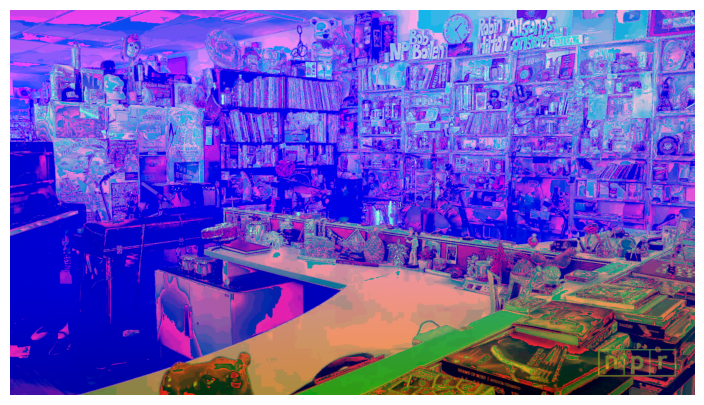

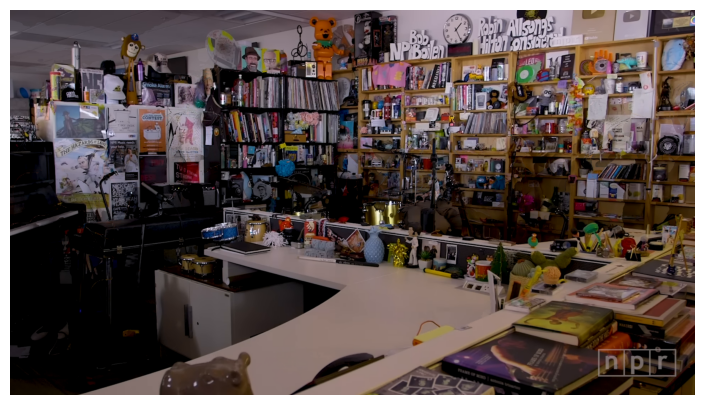

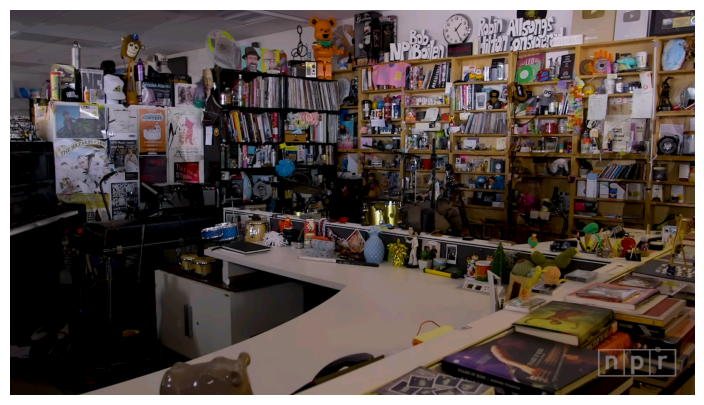

0 7


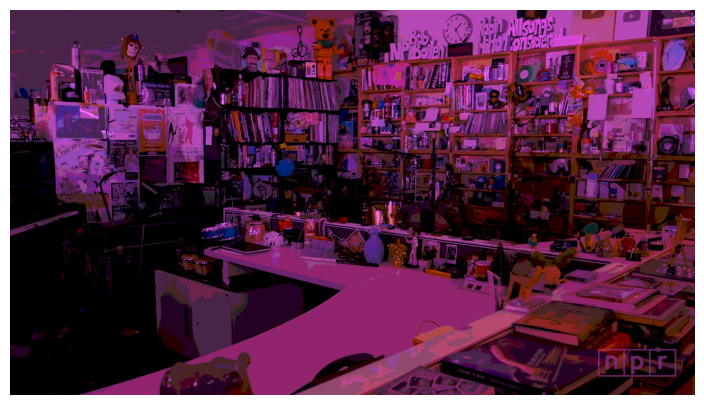

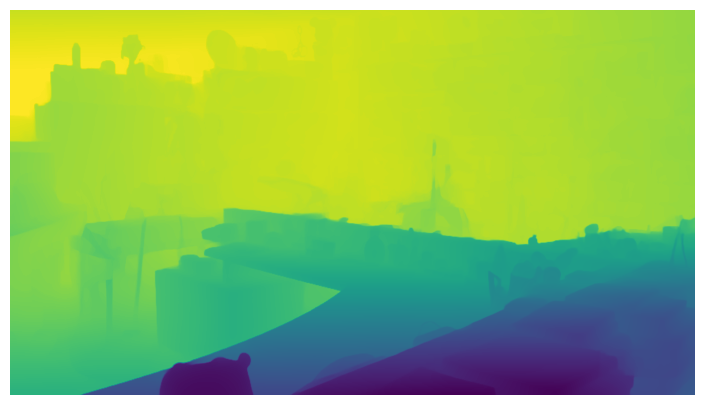

In [6]:
dual_channel_bgr = cv2.cvtColor(cv2.cvtColor(rgb, cv2.COLOR_RGB2BGR), cv2.COLOR_BGR2BGR565)
print(np.sum(dual_channel_bgr[:,:,::-1]-dual_channel_rgb))

packed_image = np.zeros_like(rgb)
packed_image[:,:,0] = dual_channel_bgr[:,:,0]
packed_image[:,:,1] = dual_channel_bgr[:,:,1]
packed_image[:,:,2] = depth_u8

show(packed_image)

dual_channel_packed = packed_image[:,:,0:2]
unpacked_bgr = cv2.cvtColor(dual_channel_packed, cv2.COLOR_BGR5652RGB)
unpacked_rgb2 = unpacked_bgr
show(rgb)
show(unpacked_rgb2)

diff = unpacked_rgb-unpacked_rgb2
print(diff.min(), diff.max())
diff = diff.astype(np.float32)
diff = (diff - diff.min()) / (diff.max() - diff.min())
show(diff)

show(packed_image[:,:,2])

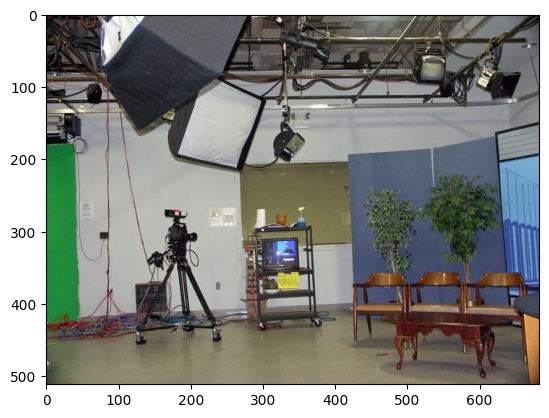

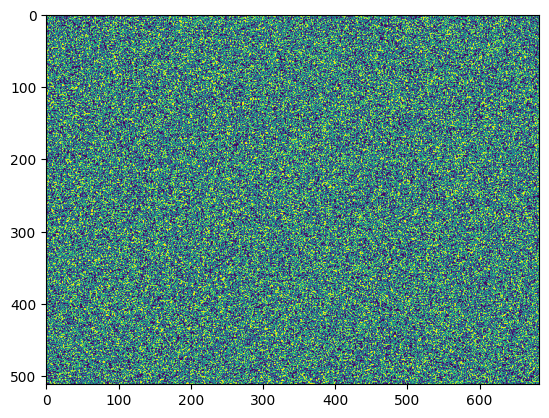

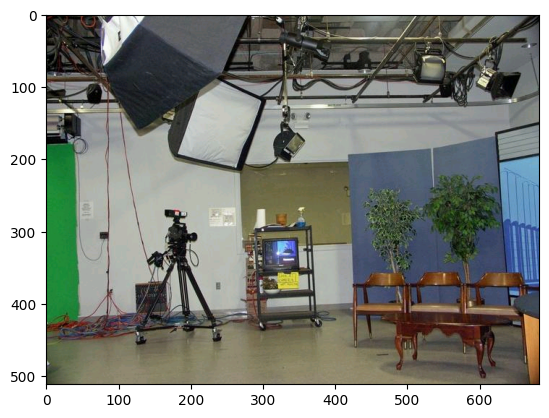

In [33]:
img = cv2.imread("C:/dev/uw/uw_courses/cse493-project/rgb565d/00000056.jpg")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()
dual_channel_bgr = cv2.cvtColor(img, cv2.COLOR_BGR2BGR565)
packed_image = np.zeros_like(img)
packed_image[:,:,0] = dual_channel_bgr[:,:,0]
packed_image[:,:,1] = dual_channel_bgr[:,:,1]
packed_image[:,:,2] = np.random.normal(0, 1, (img.shape[0], img.shape[1])) * 10

cv2.imwrite("C:/dev/uw/uw_courses/cse493-project/rgb565d/00000056_packed.png", packed_image)

# recover the channels
img_recovery = cv2.imread("C:/dev/uw/uw_courses/cse493-project/rgb565d/00000056_packed.png")
dual_channel_packed = img_recovery[:,:,0:2]
unpacked_bgr = cv2.cvtColor(dual_channel_packed, cv2.COLOR_BGR5652RGB)
unpacked_depth = img_recovery[:,:,2]
plt.imshow(unpacked_depth)
plt.show()
plt.imshow(unpacked_bgr)
plt.show()

Text(0.5, 1.0, 'Depth Image')

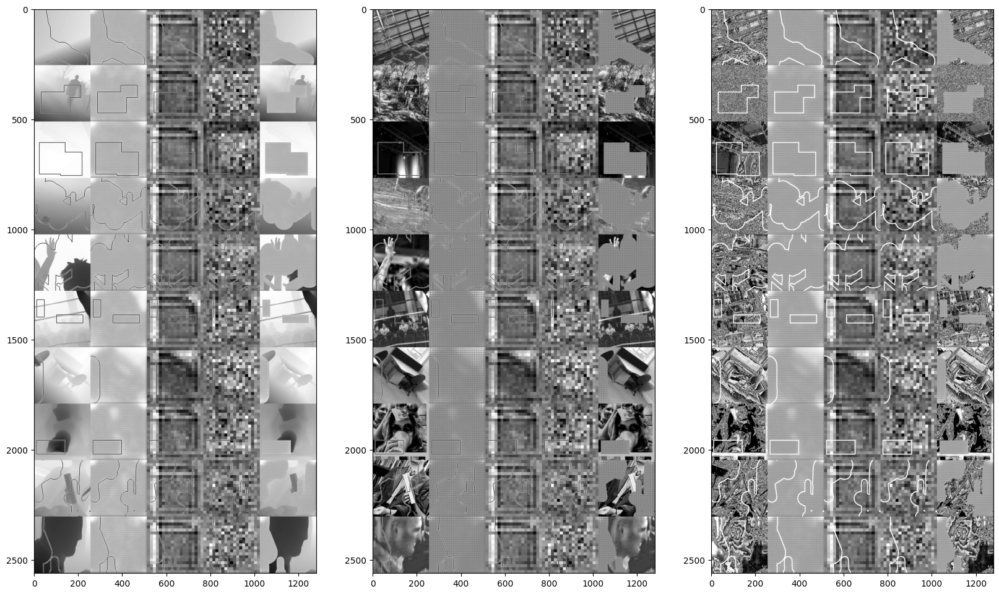

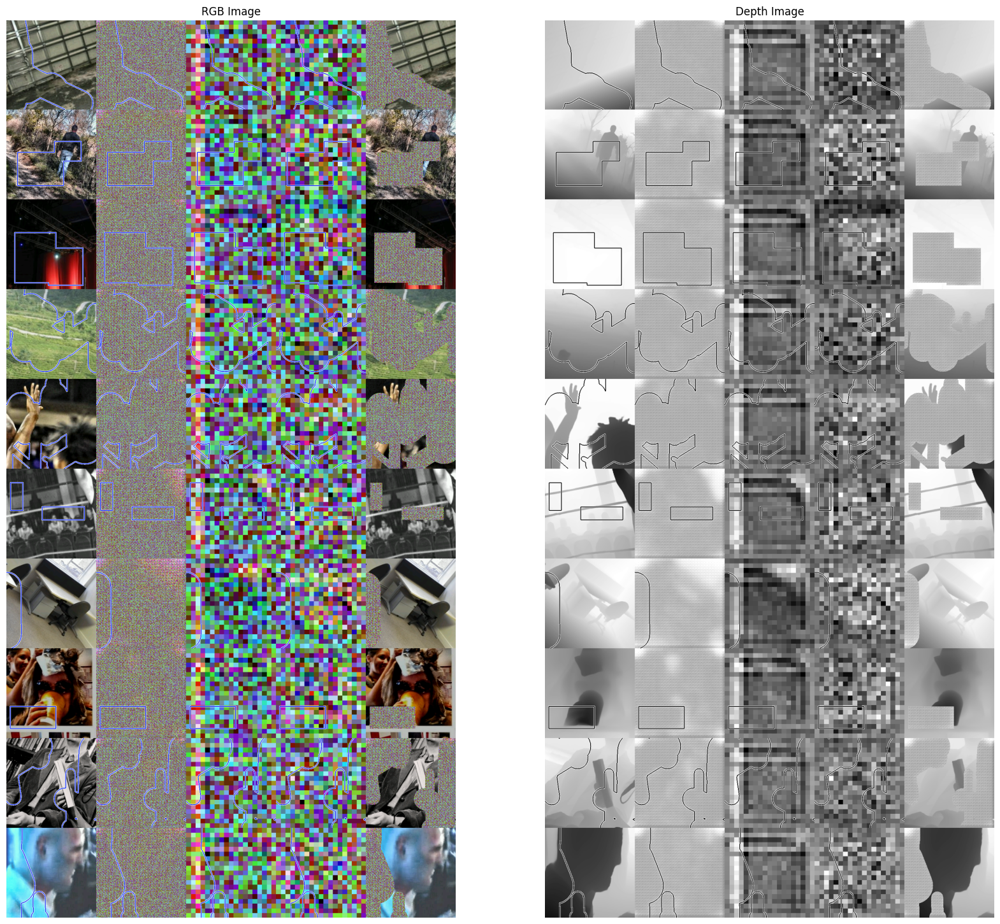

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def get_RGBD_from_RGB565D(png_image):
    # Split the PNG image into its three channels
    bgr565_low = png_image[:, :, 2]  # Low byte of BGR565
    bgr565_high = png_image[:, :, 1]  # High byte of BGR565
    depth_channel = png_image[:, :, 0]  # Depth channel

    # Combine low and high bytes to reconstruct the original BGR565 data
    bgr565 = (bgr565_high.astype(np.uint16) << 8) | bgr565_low.astype(np.uint16)

    # Convert BGR565 to RGB888
    # Reshape into a format suitable for cv2.cvtColor (2-channel uint8)
    dual_channel_packed = np.zeros((png_image.shape[0], png_image.shape[1], 2), dtype=np.uint8)
    dual_channel_packed[:, :, 0] = bgr565_low
    dual_channel_packed[:, :, 1] = bgr565_high

    # Use OpenCV to convert from BGR565 to RGB
    unpacked_rgb = cv2.cvtColor(dual_channel_packed, cv2.COLOR_BGR5652RGB)

    # Return unpacked RGB image and depth channel
    return unpacked_rgb, depth_channel

bgr565d = cv2.imread("D:/dev/lama_stereoinpainting/experiments/user_2024-11-30_01-43-11_train_lama-fourier-rgb565depth_/samples/epoch0000_train/batch0000000.png")
#bgr565d = cv2.cvtColor(bgr565d, cv2.COLOR_BGR2RGB)

# show each channel separate:
plt.figure(figsize=(20, 20))
plt.subplot(1, 3, 1)
plt.imshow(bgr565d[:,:,0], cmap="gray")
plt.subplot(1, 3, 2)
plt.imshow(bgr565d[:,:,1], cmap="gray")
plt.subplot(1, 3, 3)
plt.imshow(bgr565d[:,:,2], cmap="gray")

rgb, depth = get_RGBD_from_RGB565D(bgr565d)

plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(rgb)
plt.axis("off")
plt.title("RGB Image")

plt.subplot(1, 2, 2)
plt.imshow(depth, cmap="gray")
plt.axis("off")
plt.title("Depth Image")